# 统计学习导论第十九次作业
作业任务1：先使用线性的PCA降维实现可视化  
作业任务2：再使用非线性的Manifold Learning对比包括：多维缩放MDS、等距映射Isomap、局部线性嵌入LLE、LLE的改进MLLE、HLLE、LTSA、t分布随机邻域嵌入t-SNE、频谱嵌入Spectral Embedding  
依赖库：Sklearn

姓名：欧阳瑞志、班级：统计22、学号：220403102

## 一、数据导入与预处理
在sklearn中调用数据集MNIST手写数字太慢了，用keras调用一下

In [1]:
#--------------------------------0、数据预处理--------------------------------#

import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.manifold import MDS, Isomap, LocallyLinearEmbedding, TSNE, SpectralEmbedding
from keras.datasets import mnist

# 使用 Keras 导入 MNIST 数据集，比sklearn快
(X_train, y_train), (X_test, y_test) = mnist.load_data()

# 选择要使用的数字类别
mytargets = list(range(0, 10))
# 也可以选择代码为 3 到 8
# mytargets = [3, 8]

# 归一化，将数据从 0-255 范围归一化到 0-1 范围
X_train = X_train / 255.0

# 取 10000 个样本
num_samples_to_plot = 10000
X_train = X_train[:num_samples_to_plot]
y_train = y_train[:num_samples_to_plot]

# 将图像数据展平为一维向量
X_train = X_train.reshape(X_train.shape[0], -1)

# 统计抽样后每个数字出现的次数
for digit in mytargets:
    instances = [i for i in y_train if i == digit]
    print("Digit", digit, "appears ", len(instances), "times")


print('数据预处理完成！')

Digit 0 appears  1001 times
Digit 1 appears  1127 times
Digit 2 appears  991 times
Digit 3 appears  1032 times
Digit 4 appears  980 times
Digit 5 appears  863 times
Digit 6 appears  1014 times
Digit 7 appears  1070 times
Digit 8 appears  944 times
Digit 9 appears  978 times
数据预处理完成！


<a id="1"></a>
## 二、主成分分析PCA

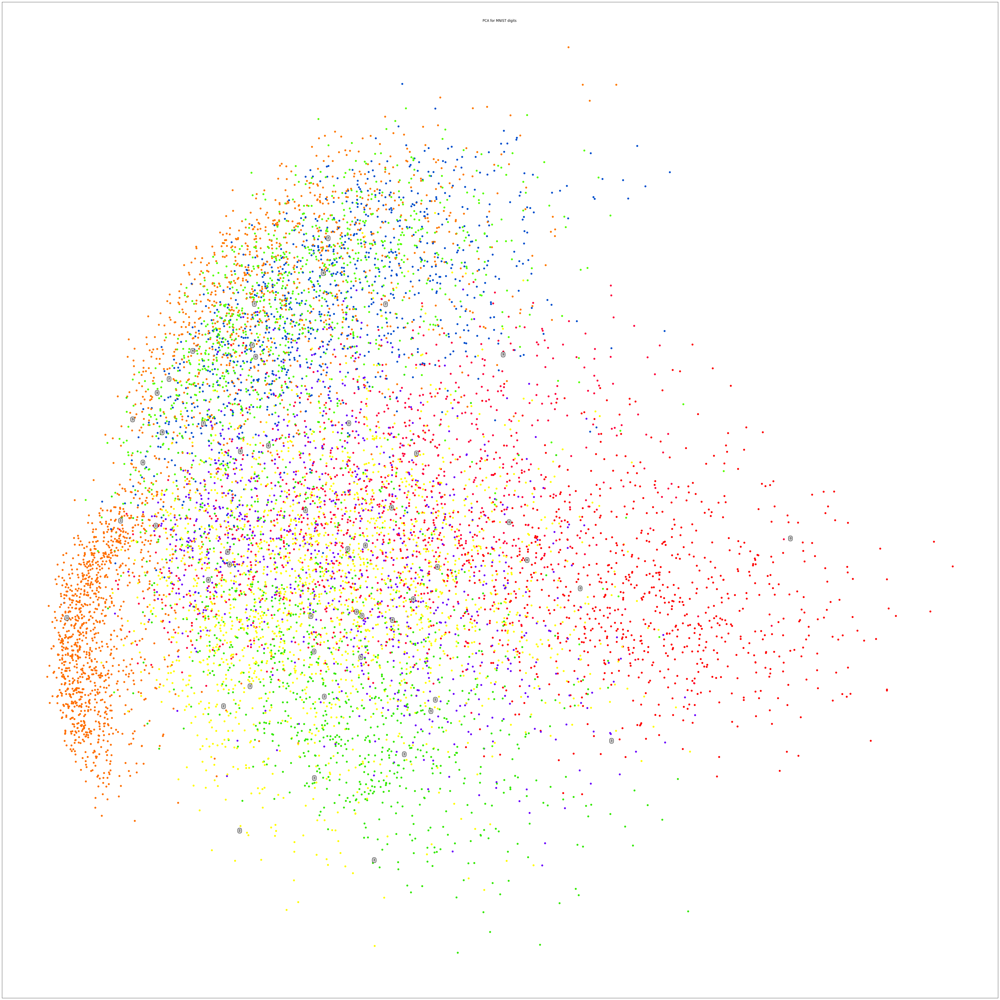

In [2]:
#--------------------------------1、PCA--------------------------------#

# PCA降维和可视化
pca = PCA(n_components=2)
fig, plot = plt.subplots()
fig.set_size_inches(50, 50)
plt.prism()

X_transformed = pca.fit_transform(X_train)
plot.scatter(X_transformed[:, 0], X_transformed[:, 1], c=y_train)
plot.set_xticks(())
plot.set_yticks(())

count=0
plt.tight_layout()
plt.suptitle("PCA for MNIST digits ")
for label , x, y in zip(y_train, X_transformed[:, 0], X_transformed[:, 1]):
  if count % 200 == 0:
    plt.annotate(str(int(label)),xy=(x,y), color='black', weight='normal',size=10,bbox=dict(boxstyle="round4,pad=.5", fc="0.8"))
  count = count + 1
plt.savefig("mnist_pca.png")

<a id="2"></a>
## 三、多维缩放MDS

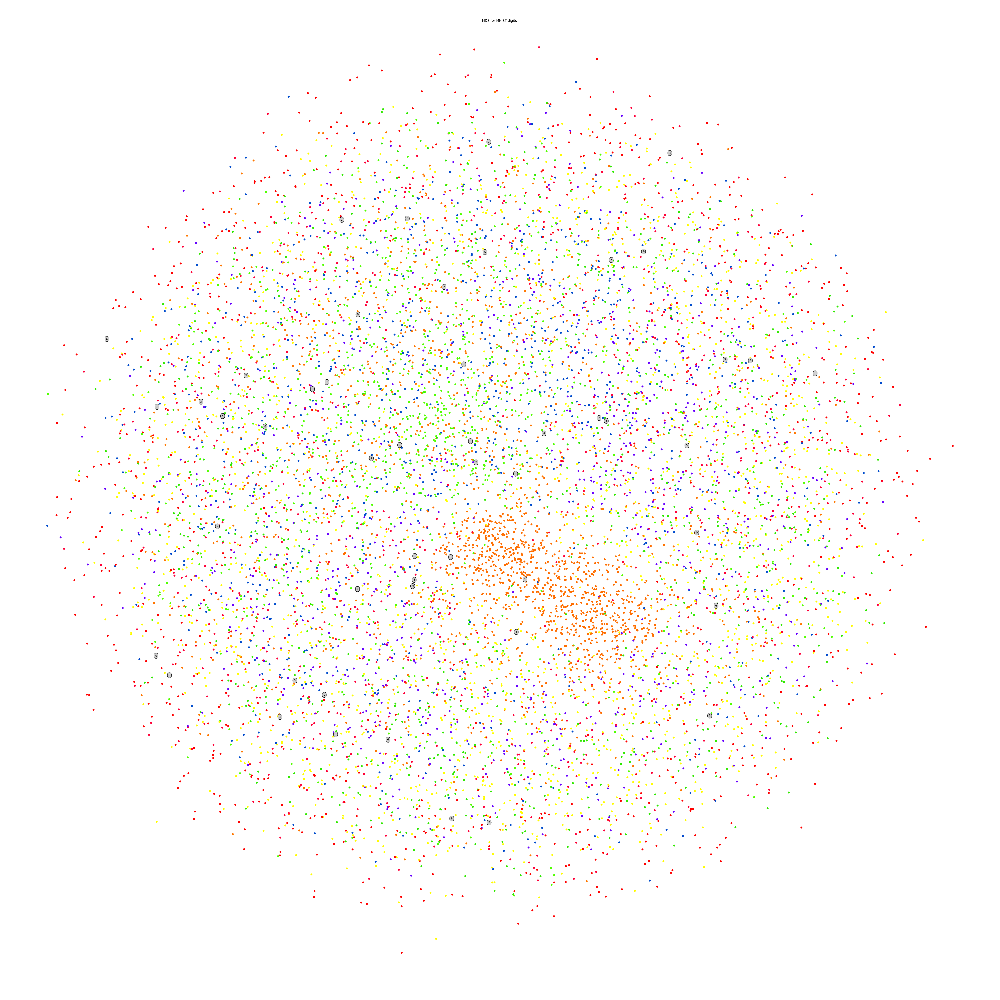

In [3]:
#--------------------------------2、MDS--------------------------------#

transformer = MDS(n_components = 2, max_iter=100, n_init=1, normalized_stress='auto')
fig, plot = plt.subplots()
fig.set_size_inches(50, 50)
plt.prism()

X_transformed = transformer.fit_transform(X_train)
plot.scatter(X_transformed[:, 0], X_transformed[:, 1], c=y_train)
plot.set_xticks(())
plot.set_yticks(())

count=0
plt.tight_layout()
plt.suptitle("MDS for MNIST digits ")
for label , x, y in zip(y_train, X_transformed[:, 0], X_transformed[:, 1]):
  if count % 200 == 0:
    plt.annotate(str(int(label)),xy=(x,y), color='black', weight='normal',size=10,bbox=dict(boxstyle="round4,pad=.5", fc="0.8"))
  count = count + 1
plt.savefig("mnist_mds.png")


<a id="3"></a>
## 四、等距映射Isomap

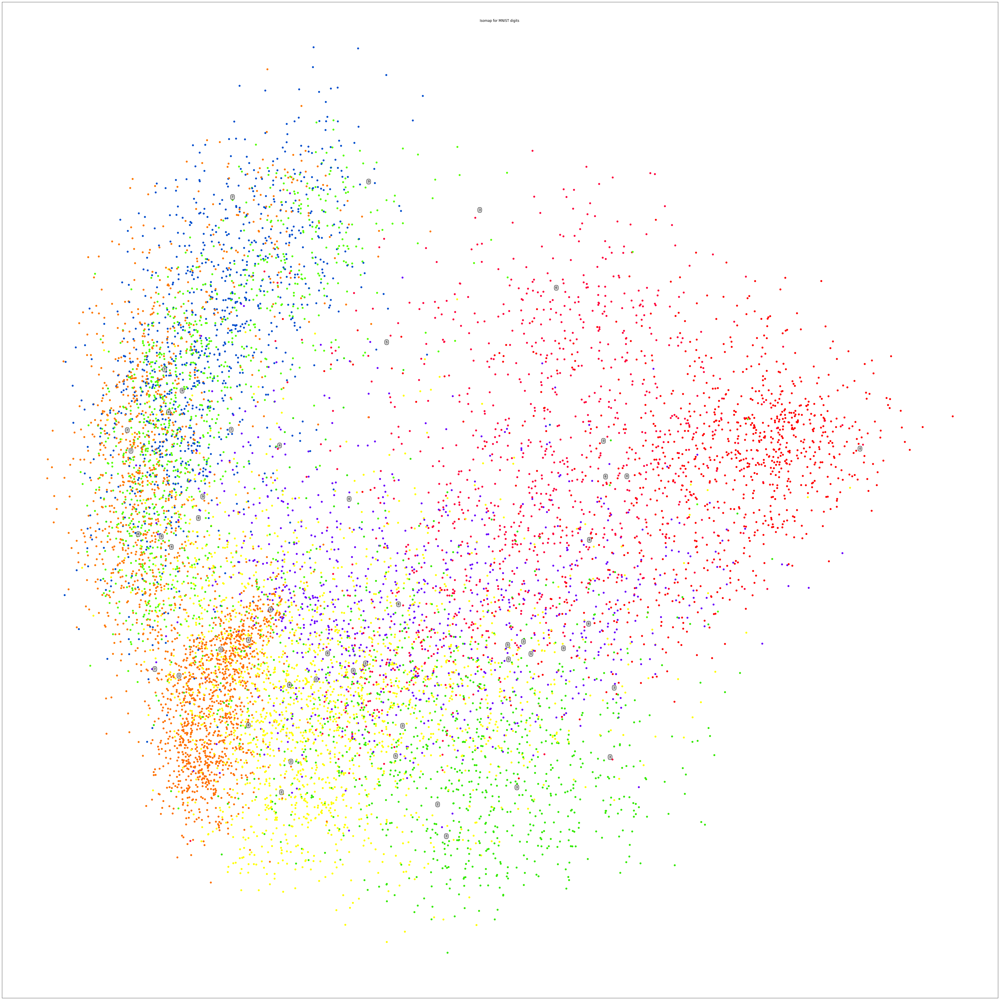

In [4]:
#--------------------------------3、Isomap--------------------------------#

transformer = Isomap(n_neighbors = 10, n_components = 2)
fig, plot = plt.subplots()
fig.set_size_inches(50, 50)
plt.prism()

X_transformed = transformer.fit_transform(X_train)
plot.scatter(X_transformed[:, 0], X_transformed[:, 1], c=y_train)
plot.set_xticks(())
plot.set_yticks(())

count=0
plt.tight_layout()
plt.suptitle("Isomap for MNIST digits ")
for label , x, y in zip(y_train, X_transformed[:, 0], X_transformed[:, 1]):
  if count % 200 == 0:
    plt.annotate(str(int(label)),xy=(x,y), color='black', weight='normal',size=10,bbox=dict(boxstyle="round4,pad=.5", fc="0.8"))
  count = count + 1
plt.savefig("mnist_isomap.png")

<a id="4.1"></a>
## 五、局部线性嵌入LLE
### 5.1 标准LLE

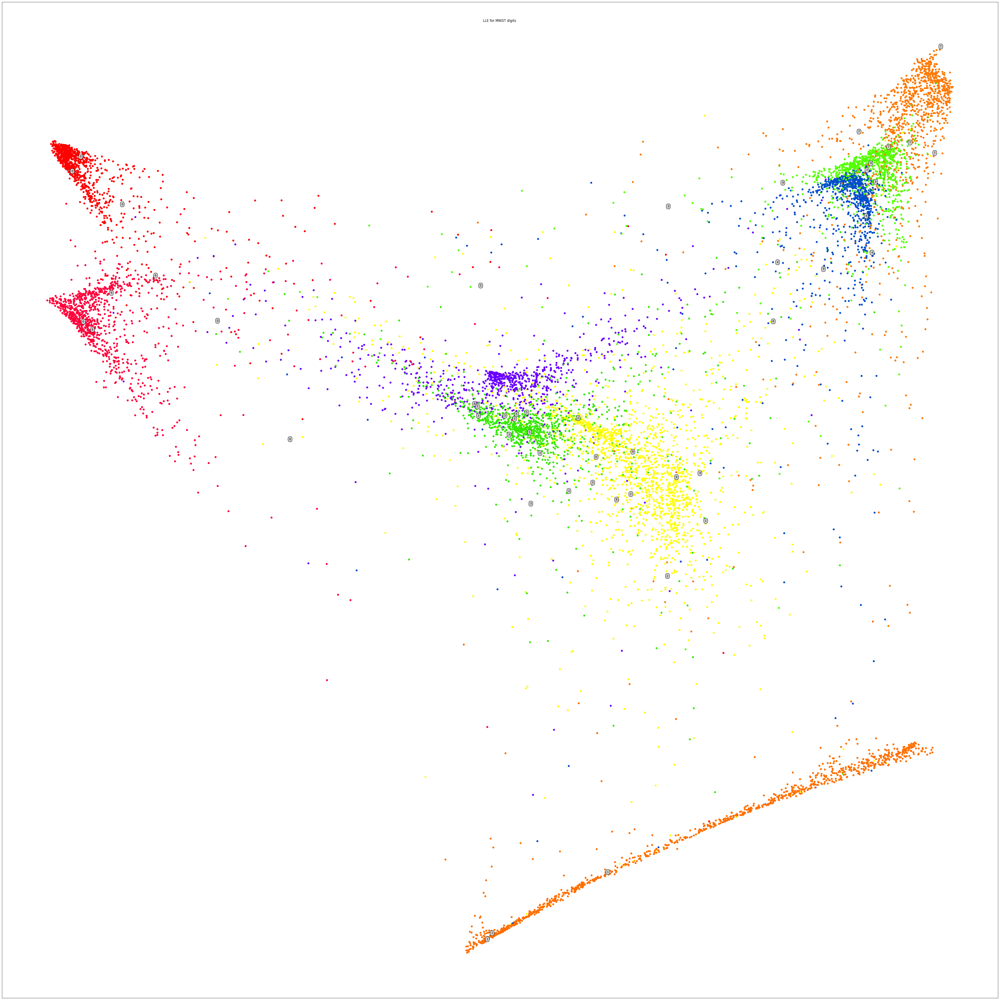

In [5]:
#--------------------------------4、LLE--------------------------------#
## 4.1 标准LLE
transformer = LocallyLinearEmbedding(n_neighbors = 10, n_components = 2,
                                     eigen_solver='dense', method='standard')
fig, plot = plt.subplots()
fig.set_size_inches(50, 50)
plt.prism()

X_transformed = transformer.fit_transform(X_train)
plot.scatter(X_transformed[:, 0], X_transformed[:, 1], c=y_train)
plot.set_xticks(())
plot.set_yticks(())

count=0
plt.tight_layout()
plt.suptitle("LLE for MNIST digits ")
for label , x, y in zip(y_train, X_transformed[:, 0], X_transformed[:, 1]):
  if count % 200 == 0:
    plt.annotate(str(int(label)),xy=(x,y), color='black', weight='normal',size=10,bbox=dict(boxstyle="round4,pad=.5", fc="0.8"))
  count = count + 1
plt.savefig("mnist_lle.png")

<a id="4.2"></a>
### 5.2 改进LLE

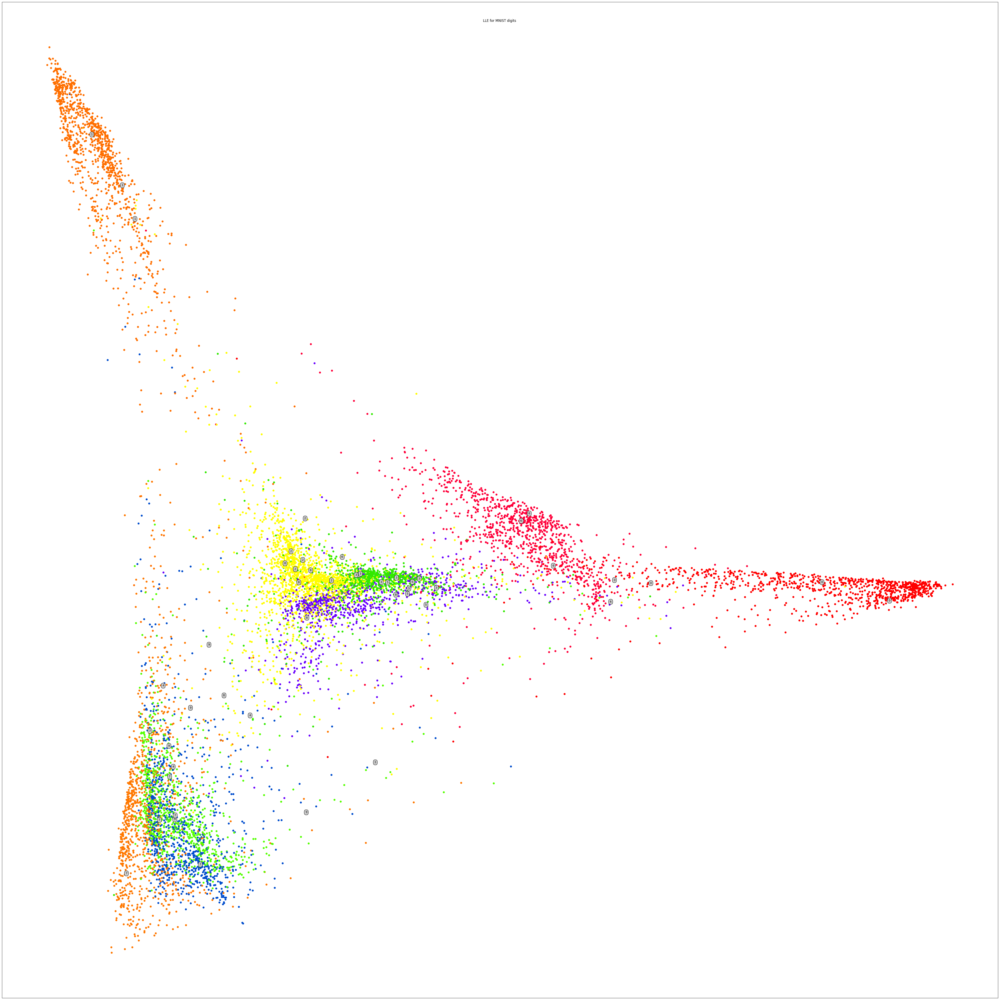

In [6]:
## 4.2 改进LLE
transformer = LocallyLinearEmbedding(n_neighbors = 10, n_components = 2,
                                     eigen_solver='dense', method='modified')
fig, plot = plt.subplots()
fig.set_size_inches(50, 50)
plt.prism()

X_transformed = transformer.fit_transform(X_train)
plot.scatter(X_transformed[:, 0], X_transformed[:, 1], c=y_train)
plot.set_xticks(())
plot.set_yticks(())

count=0
plt.tight_layout()
plt.suptitle("LLE for MNIST digits ")
for label , x, y in zip(y_train, X_transformed[:, 0], X_transformed[:, 1]):
  if count % 200 == 0:
    plt.annotate(str(int(label)),xy=(x,y), color='black', weight='normal',size=10,bbox=dict(boxstyle="round4,pad=.5", fc="0.8"))
  count = count + 1
plt.savefig("mnist_mlle.png")

<a id="4.3"></a>
### 5.3 Hessian特征映射

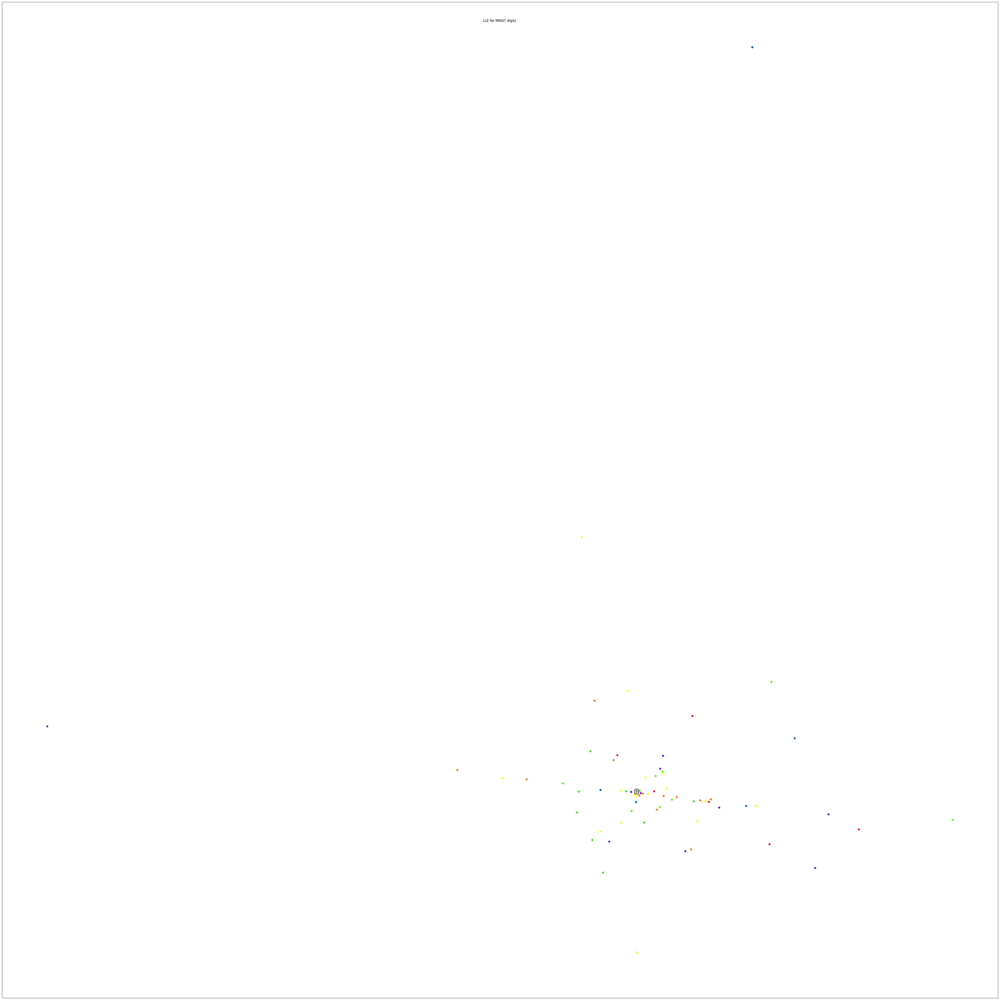

In [7]:
## 4.3 Hessian特征映射
transformer = LocallyLinearEmbedding(n_neighbors = 10, n_components = 2,
                                     eigen_solver='dense', method='hessian')
fig, plot = plt.subplots()
fig.set_size_inches(50, 50)
plt.prism()

X_transformed = transformer.fit_transform(X_train)
plot.scatter(X_transformed[:, 0], X_transformed[:, 1], c=y_train)
plot.set_xticks(())
plot.set_yticks(())

count=0
plt.tight_layout()
plt.suptitle("LLE for MNIST digits ")
for label , x, y in zip(y_train, X_transformed[:, 0], X_transformed[:, 1]):
  if count % 200 == 0:
    plt.annotate(str(int(label)),xy=(x,y), color='black', weight='normal',size=10,bbox=dict(boxstyle="round4,pad=.5", fc="0.8"))
  count = count + 1
plt.savefig("mnist_hlle.png")

<a id="4.4"></a>
### 5.4 局部切空间对齐(LTSA)

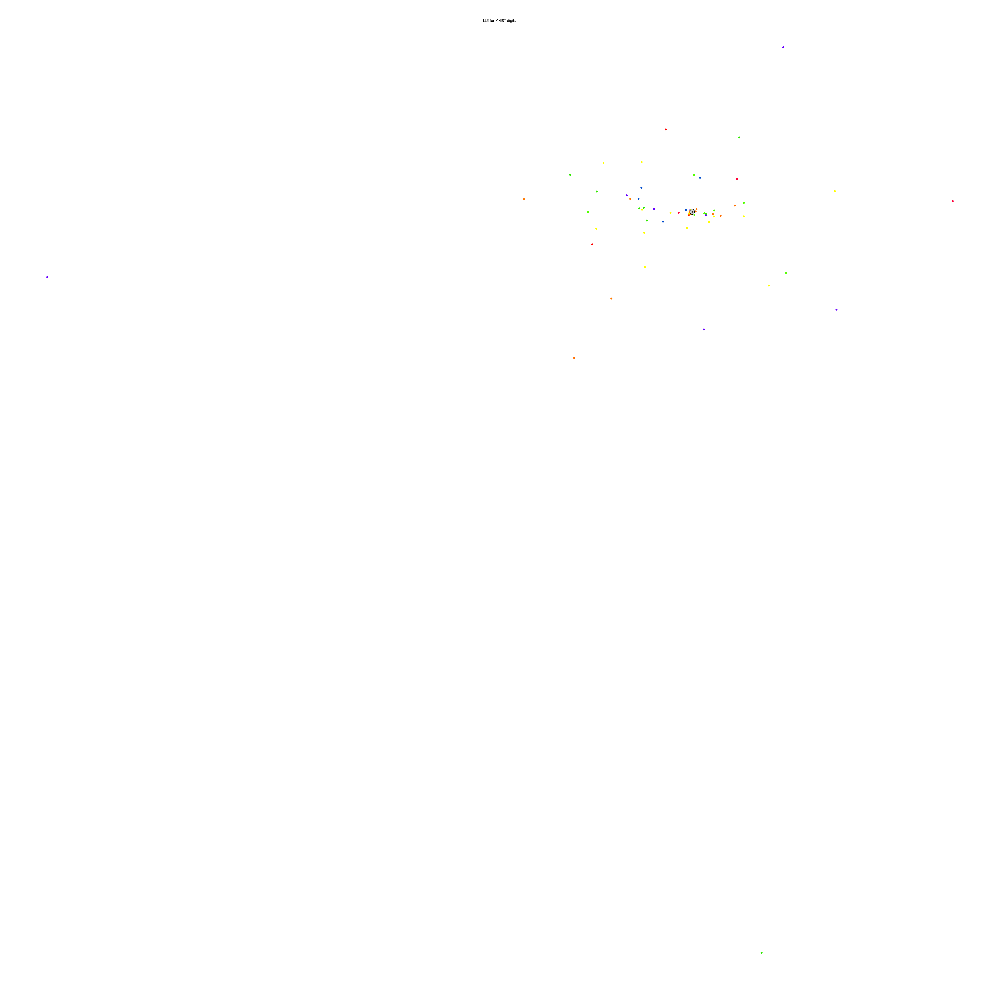

In [8]:
## 4.4 局部切空间对齐(LTSA)
transformer = LocallyLinearEmbedding(n_neighbors = 10, n_components = 2,
                                     eigen_solver='dense', method='ltsa')
fig, plot = plt.subplots()
fig.set_size_inches(50, 50)
plt.prism()

X_transformed = transformer.fit_transform(X_train)
plot.scatter(X_transformed[:, 0], X_transformed[:, 1], c=y_train)
plot.set_xticks(())
plot.set_yticks(())

count=0
plt.tight_layout()
plt.suptitle("LLE for MNIST digits ")
for label , x, y in zip(y_train, X_transformed[:, 0], X_transformed[:, 1]):
  if count % 200 == 0:
    plt.annotate(str(int(label)),xy=(x,y), color='black', weight='normal',size=10,bbox=dict(boxstyle="round4,pad=.5", fc="0.8"))
  count = count + 1
plt.savefig("mnist_ltsa.png")

<a id="5"></a>
## 六、t分布随机邻域嵌入t-SNE

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.002s...
[t-SNE] Computed neighbors for 10000 samples in 0.845s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 2.137393
[t-SNE] Computed conditional probabilities in 0.143s
[t-SNE] Iteration 50: error = 88.3699951, gradient norm = 0.0122744 (50 iterations in 1.412s)
[t-SNE] I

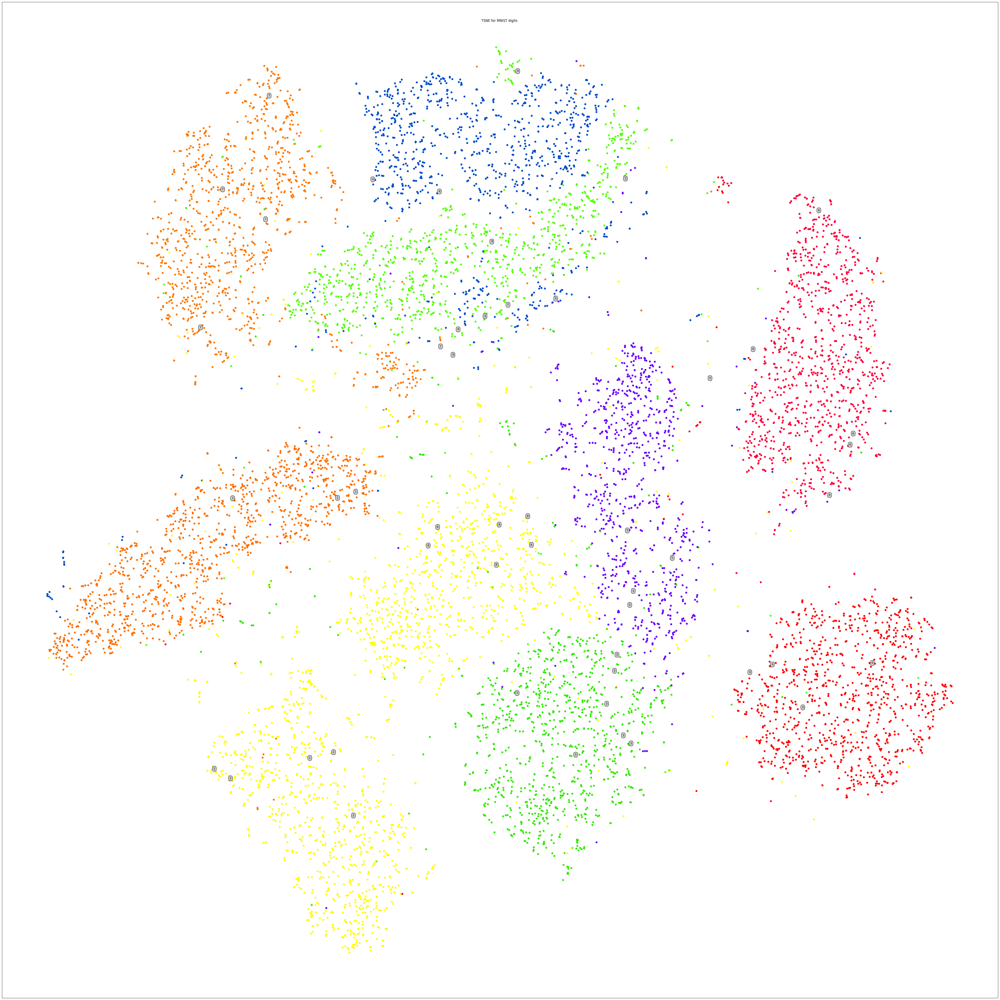

In [9]:
#--------------------------------5、t-sne--------------------------------#

transformer = TSNE(n_components = 2, perplexity=40, verbose=2)
fig, plot = plt.subplots()
fig.set_size_inches(50, 50)
plt.prism()

X_transformed = transformer.fit_transform(X_train)
plot.scatter(X_transformed[:, 0], X_transformed[:, 1], c=y_train)
plot.set_xticks(())
plot.set_yticks(())

count=0
plt.tight_layout()
plt.suptitle("TSNE for MNIST digits ")
for label , x, y in zip(y_train, X_transformed[:, 0], X_transformed[:, 1]):
  if count % 200 == 0:
    plt.annotate(str(int(label)),xy=(x,y), color='black', weight='normal',size=10,bbox=dict(boxstyle="round4,pad=.5", fc="0.8"))
  count = count + 1
plt.savefig("mnist_sne.png")

<a id="6"></a>
## 七、频谱嵌入(Spectral Embedding)

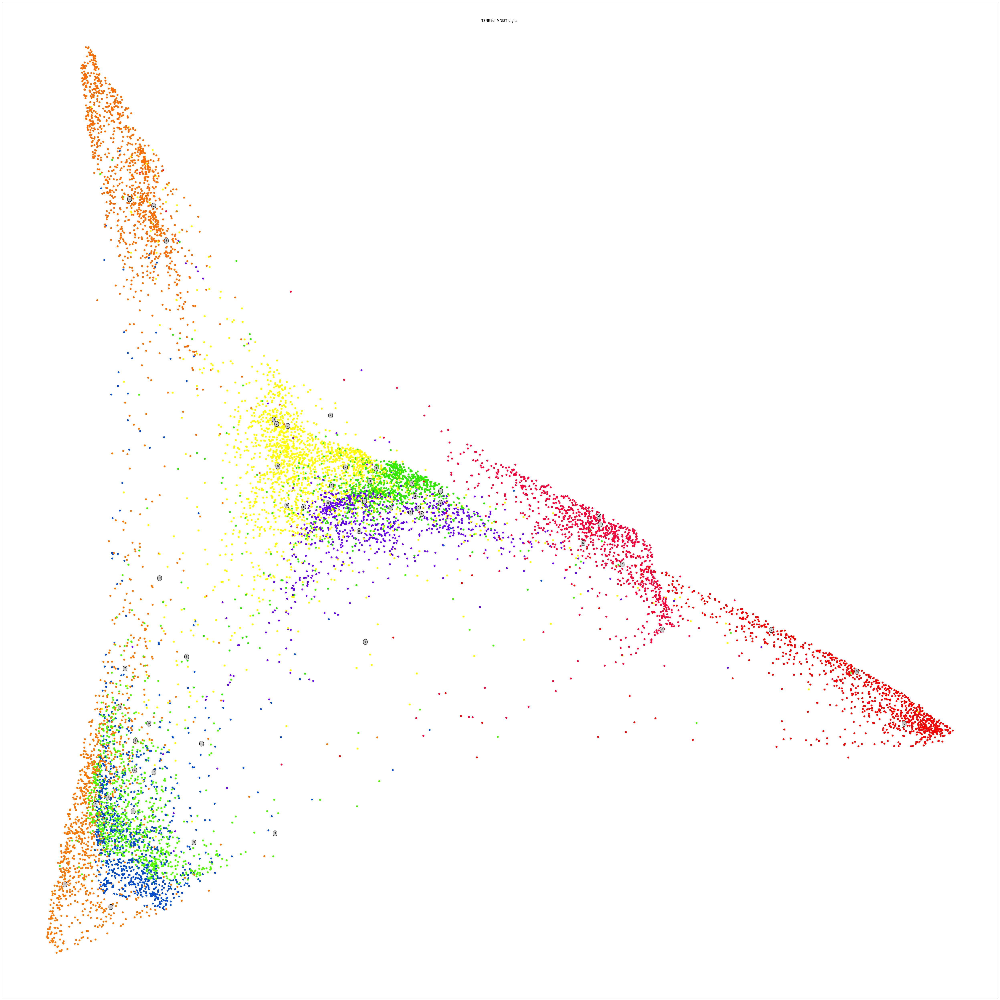

In [10]:
#--------------------------------6、 频谱嵌入(Spectral Embedding)--------------------------------#

transformer = SpectralEmbedding(n_components = 2, n_neighbors = 10)
fig, plot = plt.subplots()
fig.set_size_inches(50, 50)
plt.prism()

X_transformed = transformer.fit_transform(X_train)
plot.scatter(X_transformed[:, 0], X_transformed[:, 1], c=y_train)
plot.set_xticks(())
plot.set_yticks(())

count=0
plt.tight_layout()
plt.suptitle("TSNE for MNIST digits ")
for label , x, y in zip(y_train, X_transformed[:, 0], X_transformed[:, 1]):
  if count % 200 == 0:
    plt.annotate(str(int(label)),xy=(x,y), color='black', weight='normal',size=10,bbox=dict(boxstyle="round4,pad=.5", fc="0.8"))
  count = count + 1
plt.savefig("mnist_se.png")

__感觉t-SNE效果最好__